In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
df = pd.read_csv('Datasets/Arrithmia_cleanes.csv')


In [7]:
df.drop(columns = ['Unnamed: 0', 'record'],inplace  = True)

In [16]:
df

,type,0_pre-RR,0_post-RR,0_pPeak,0_tPeak,0_rPeak,0_sPeak,0_qPeak,0_qrs_interval,0_pq_interval,...,0_qrs_morph4,1_pPeak,1_tPeak,1_rPeak,1_sPeak,1_qPeak,1_qrs_interval,1_pq_interval,1_qt_interval,1_st_interval
0,N,330,329.0,-0.062253,-0.320439,1.046135,-0.444251,-0.073810,22,4,...,-0.041885,-0.006129,-0.014734,-0.015977,-0.015977,-0.024310,4,9,14,1
1,N,329,323.0,-0.074389,-0.302184,0.999053,-0.367677,-0.093196,22,11,...,0.119165,-0.018272,0.010559,0.028772,-0.080362,-0.031727,32,9,49,8
2,N,323,326.0,-0.064984,-0.290534,0.993015,-0.308465,-0.076629,23,5,...,-0.053601,-0.008597,0.055741,-0.017118,-0.077358,-0.020204,12,8,29,9
3,N,326,319.0,-0.072106,-0.315602,0.914281,-0.332271,-0.086239,22,5,...,-0.016841,-0.016812,0.014092,0.023347,-0.095587,-0.036039,33,10,52,9
4,N,313,328.0,-0.109740,-0.331818,0.963099,-0.377804,-0.137908,22,6,...,-0.026135,-0.014388,0.020378,0.026713,-0.086647,-0.038328,28,10,47,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22629,N,243,245.0,0.147228,-0.399865,1.379833,-0.746048,-0.138109,34,20,...,0.703466,-0.049193,0.308729,-0.024557,-0.024557,-0.075580,7,6,22,9
22630,N,243,243.0,-0.098084,-0.363152,1.326968,-0.700431,-0.107764,23,4,...,0.085047,-0.073822,0.385208,-0.045980,-0.045980,-0.075041,7,4,20,9
22631,N,243,247.0,-0.091347,-0.409054,1.404307,-0.733255,-0.102448,25,5,...,0.082942,-0.062491,0.380032,-0.022478,-0.022478,-0.087191,8,7,24,9
22632,N,241,251.0,-0.095250,-0.429370,1.399131,-0.686280,-0.095889,26,1,...,0.216953,-0.046497,0.445392,-0.047124,-0.047124,-0.073298,5,6,20,9


In [13]:
X = df.drop('type',axis = 1)
y = df['type']

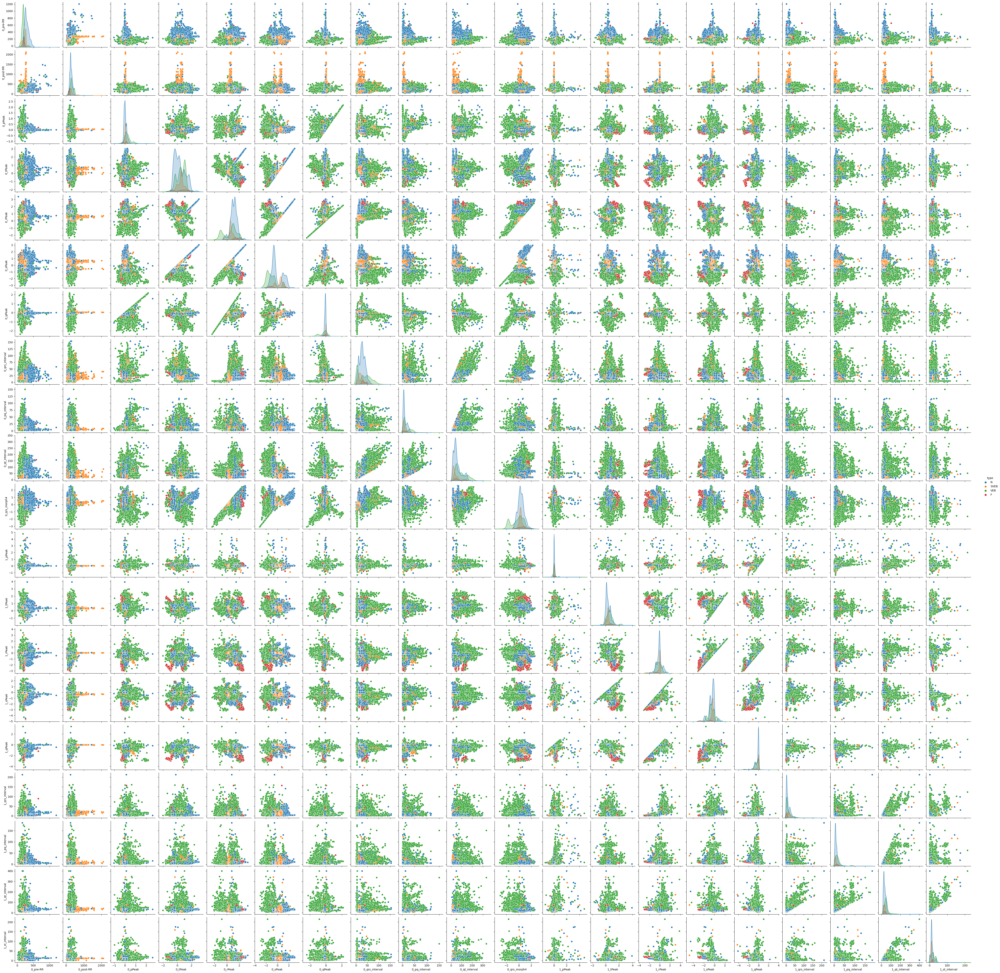

In [18]:
sns.pairplot(data = df ,hue = 'type')

C:\Users\Sameer\AppData\Local\Temp\ipykernel_10232\881351215.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),annot=True)


<Axes: >

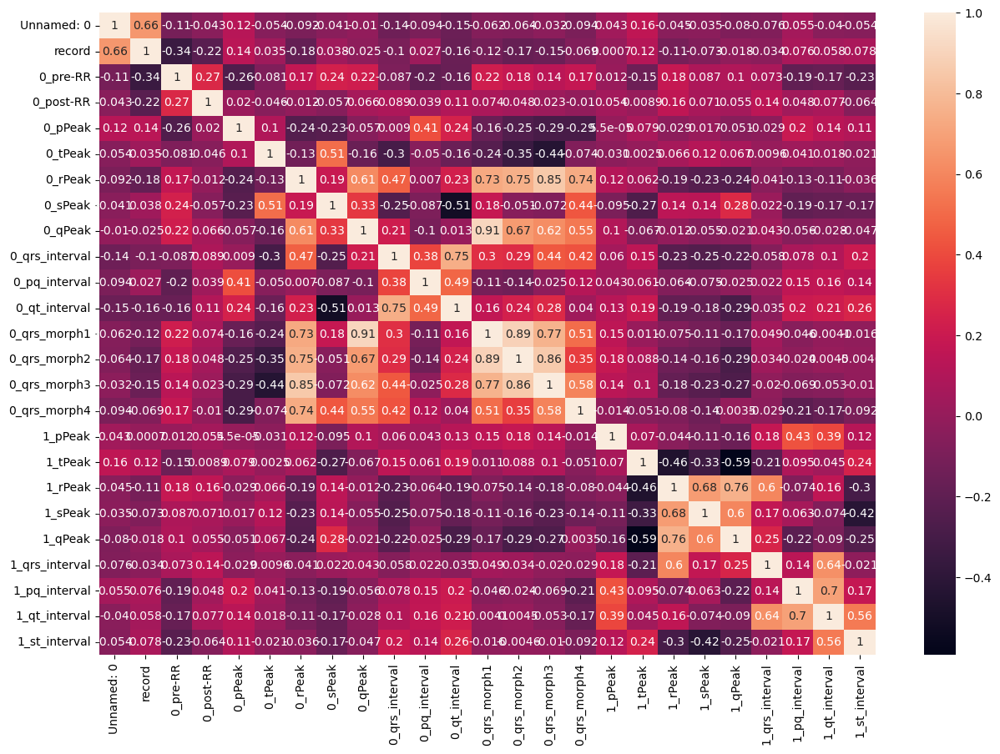

In [20]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),annot=True)

In [71]:
def find_corr(dataset, threshold):
    cor_col = set()
    corr_matrix = df.corr(numeric_only = True)
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if(abs(corr_matrix.iloc[i,j])) > threshold:
                colname = corr_matrix.columns[i]
                cor_col.add(colname)
    return cor_col

In [72]:
find_corr(df,0.78)

{'0_qrs_morph1', '0_qrs_morph2', '0_qrs_morph3'}

In [3]:
df.drop(columns = ['0_qrs_morph1', '0_qrs_morph2', '0_qrs_morph3'],inplace = True)

In [6]:
df.shape

(22634, 23)

C:\Users\Sameer\AppData\Local\Temp\ipykernel_10232\1897765154.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),annot=True)


<Axes: >

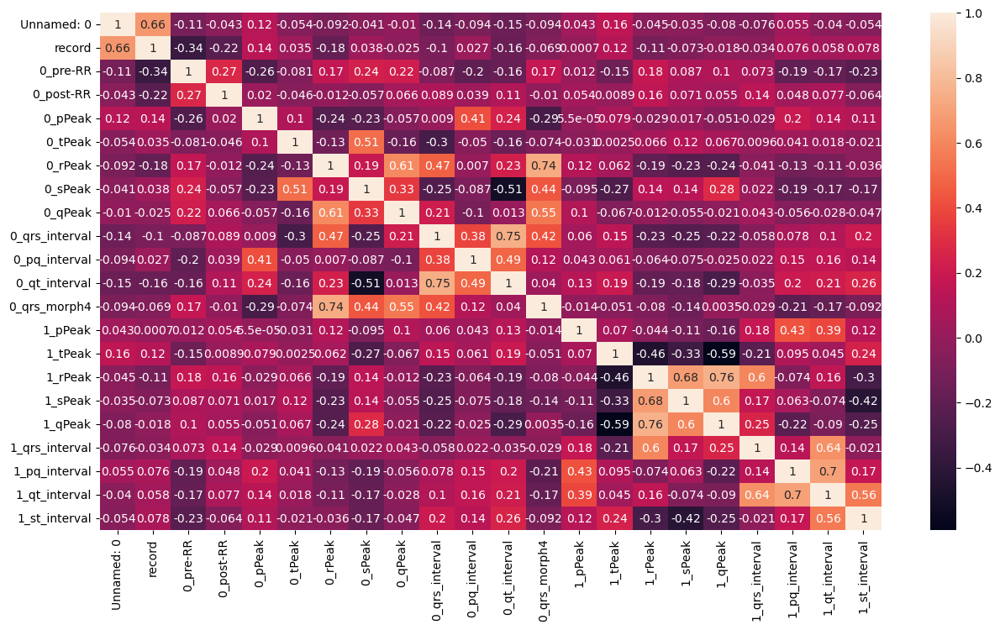

In [34]:
plt.figure(figsize=(15,8))

sns.heatmap(df.corr(),annot=True)

In [ ]:
plt.switch_backend('TkAgg')

# Assuming 'df' is your DataFrame and 'type' is a categorical column for hue
sns.pairplot(data=df, hue='type')

# Save the plot to a PDF file
plt.savefig("seaborn_plot.pdf", format='pdf', bbox_inches='tight')

In [19]:
df['type'] = df['type'].map({'N':False, 'SVEB':True, 'VEB':True, 'F':True})

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22634 entries, 0 to 22633
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   record          22634 non-null  int64  
 1   type            22634 non-null  bool   
 2   0_pre-RR        22634 non-null  int64  
 3   0_post-RR       22634 non-null  float64
 4   0_pPeak         22634 non-null  float64
 5   0_tPeak         22634 non-null  float64
 6   0_rPeak         22634 non-null  float64
 7   0_sPeak         22634 non-null  float64
 8   0_qPeak         22634 non-null  float64
 9   0_qrs_interval  22634 non-null  int64  
 10  0_pq_interval   22634 non-null  int64  
 11  0_qt_interval   22634 non-null  int64  
 12  0_qrs_morph4    22634 non-null  float64
 13  1_pPeak         22634 non-null  float64
 14  1_tPeak         22634 non-null  float64
 15  1_rPeak         22634 non-null  float64
 16  1_sPeak         22634 non-null  float64
 17  1_qPeak         22634 non-null 

In [17]:
df.drop(columns = ['Unnamed: 0'],inplace  = True)
# , 'record', 'type'

In [43]:
X = df.copy()

In [44]:
X

,0_pre-RR,0_post-RR,0_pPeak,0_tPeak,0_rPeak,0_sPeak,0_qPeak,0_qrs_interval,0_pq_interval,0_qt_interval,0_qrs_morph4,1_pPeak,1_tPeak,1_rPeak,1_sPeak,1_qPeak,1_qrs_interval,1_pq_interval,1_qt_interval,1_st_interval
0,330,329.0,-0.062253,-0.320439,1.046135,-0.444251,-0.073810,22,4,33,-0.041885,-0.006129,-0.014734,-0.015977,-0.015977,-0.024310,4,9,14,1
1,329,323.0,-0.074389,-0.302184,0.999053,-0.367677,-0.093196,22,11,39,0.119165,-0.018272,0.010559,0.028772,-0.080362,-0.031727,32,9,49,8
2,323,326.0,-0.064984,-0.290534,0.993015,-0.308465,-0.076629,23,5,31,-0.053601,-0.008597,0.055741,-0.017118,-0.077358,-0.020204,12,8,29,9
3,326,319.0,-0.072106,-0.315602,0.914281,-0.332271,-0.086239,22,5,32,-0.016841,-0.016812,0.014092,0.023347,-0.095587,-0.036039,33,10,52,9
4,313,328.0,-0.109740,-0.331818,0.963099,-0.377804,-0.137908,22,6,33,-0.026135,-0.014388,0.020378,0.026713,-0.086647,-0.038328,28,10,47,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22629,243,245.0,0.147228,-0.399865,1.379833,-0.746048,-0.138109,34,20,62,0.703466,-0.049193,0.308729,-0.024557,-0.024557,-0.075580,7,6,22,9
22630,243,243.0,-0.098084,-0.363152,1.326968,-0.700431,-0.107764,23,4,35,0.085047,-0.073822,0.385208,-0.045980,-0.045980,-0.075041,7,4,20,9
22631,243,247.0,-0.091347,-0.409054,1.404307,-0.733255,-0.102448,25,5,38,0.082942,-0.062491,0.380032,-0.022478,-0.022478,-0.087191,8,7,24,9
22632,241,251.0,-0.095250,-0.429370,1.399131,-0.686280,-0.095889,26,1,34,0.216953,-0.046497,0.445392,-0.047124,-0.047124,-0.073298,5,6,20,9


In [45]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [46]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train_scaled = sc.fit_transform(X_train)
X_test_scaled = sc.transform(X_test)

In [48]:
from sklearn.linear_model import LogisticRegression
log_reg = LogisticRegression()
log_reg.fit(X_train,y_train)
y_pred_log_reg = log_reg.predict(X_test)

In [50]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test,y_pred_log_reg))

0.8493975903614458


In [79]:
X_train.columns

Index(['0_pre-RR', '0_post-RR', '0_pPeak', '0_tPeak', '0_rPeak', '0_sPeak',
       '0_qPeak', '0_qrs_interval', '0_pq_interval', '0_qt_interval',
       '0_qrs_morph4', '1_pPeak', '1_tPeak', '1_rPeak', '1_sPeak', '1_qPeak',
       '1_qrs_interval', '1_pq_interval', '1_qt_interval', '1_st_interval'],
      dtype='object')

In [82]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier()
clf.fit(X_train,y_train)
y_pred_clf = clf.predict(X_test)
print(accuracy_score(y_test,y_pred_clf))

0.9726907630522088


## Hyperparameter Tuning 

In [53]:
param_grid = { 
    'n_estimators': [200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}

In [60]:
CV_rfc = GridSearchCV(RandomForestClassifier(), param_grid=param_grid,refit=True,cv = 5,verbose=3)

<IPython.core.display.Javascript object>

In [61]:
CV_rfc.fit(X_train_scaled, y_train)

Fitting 5 folds for each of 60 candidates, totalling 300 fits


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200;, score=0.846 total time=   3.0s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200;, score=0.842 total time=   2.9s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200;, score=0.838 total time=   2.9s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200;, score=0.839 total time=   2.9s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=gini, max_depth=4, max_features=auto, n_estimators=200;, score=0.839 total time=   2.9s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, n_estimators=500;, score=0.839 total time=   7.5s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=gini, max_depth=4, max_features=auto, n_estimators=500;, score=0.844 total time=   7.6s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=gini, max_depth=4, max_features=auto, n_estimators=500;, score=0.839 total time=   7.1s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=gini, max_depth=4, max_features=auto, n_estimators=500;, score=0.842 total time=   7.4s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=gini, max_depth=4, max_features=auto, n_estimators=500;, score=0.846 total time=   7.4s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=200;, score=0.833 total time=   2.9s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=200;, score=0.837 total time=   2.9s
[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=200;, score=0.834 total time=   2.8s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=200;, score=0.842 total time=   3.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=200;, score=0.840 total time=   3.1s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=500;, score=0.841 total time=   7.5s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=500;, score=0.839 total time=   7.4s
[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, n_estimators=500;, score=0.835 total time=   7.4s
[

C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, n_estimators=200;, score=0.875 total time=   3.6s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=gini, max_depth=5, max_features=auto, n_estimators=200;, score=0.874 total time=   3.6s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=gini, max_depth=5, max_features=auto, n_estimators=200;, score=0.873 total time=   3.6s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=gini, max_depth=5, max_features=auto, n_estimators=200;, score=0.875 total time=   3.6s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=gini, max_depth=5, max_features=auto, n_estimators=200;, score=0.877 total time=   3.6s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, n_estimators=500;, score=0.875 total time=   9.1s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=gini, max_depth=5, max_features=auto, n_estimators=500;, score=0.876 total time=   9.0s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=gini, max_depth=5, max_features=auto, n_estimators=500;, score=0.872 total time=   8.9s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=gini, max_depth=5, max_features=auto, n_estimators=500;, score=0.873 total time=   9.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=gini, max_depth=5, max_features=auto, n_estimators=500;, score=0.878 total time=   9.1s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200;, score=0.878 total time=   3.5s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200;, score=0.877 total time=   3.5s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200;, score=0.873 total time=   3.5s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200;, score=0.875 total time=   3.6s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, n_estimators=200;, score=0.878 total time=   3.5s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500;, score=0.877 total time=   8.9s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500;, score=0.874 total time=   9.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, n_estimators=500;, score=0.871 total time=   9.0s
[

C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200;, score=0.898 total time=   4.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200;, score=0.907 total time=   4.1s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200;, score=0.906 total time=   4.1s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200;, score=0.903 total time=   4.1s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=gini, max_depth=6, max_features=auto, n_estimators=200;, score=0.910 total time=   4.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=gini, max_depth=6, max_features=auto, n_estimators=500;, score=0.899 total time=  10.4s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=gini, max_depth=6, max_features=auto, n_estimators=500;, score=0.907 total time=  10.4s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=gini, max_depth=6, max_features=auto, n_estimators=500;, score=0.905 total time=  10.4s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=gini, max_depth=6, max_features=auto, n_estimators=500;, score=0.903 total time=  10.7s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=gini, max_depth=6, max_features=auto, n_estimators=500;, score=0.908 total time=  10.4s
[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200;, score=0.902 total time=   4.2s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200;, score=0.905 total time=   4.1s
[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200;, score=0.906 total time=   4.1s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200;, score=0.901 total time=   4.2s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=200;, score=0.907 total time=   4.1s
[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500;, score=0.904 total time=  10.5s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500;, score=0.906 total time=  10.4s
[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, n_estimators=500;, score=0.907 total time=  10.4s
[

C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=gini, max_depth=7, max_features=auto, n_estimators=200;, score=0.923 total time=   4.7s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=gini, max_depth=7, max_features=auto, n_estimators=200;, score=0.926 total time=   4.7s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=gini, max_depth=7, max_features=auto, n_estimators=200;, score=0.924 total time=   4.7s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, n_estimators=200;, score=0.923 total time=   4.7s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, n_estimators=200;, score=0.923 total time=   4.7s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=gini, max_depth=7, max_features=auto, n_estimators=500;, score=0.925 total time=  11.8s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=gini, max_depth=7, max_features=auto, n_estimators=500;, score=0.925 total time=  11.9s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=gini, max_depth=7, max_features=auto, n_estimators=500;, score=0.922 total time=  11.9s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, n_estimators=500;, score=0.924 total time=  11.9s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, n_estimators=500;, score=0.923 total time=  11.9s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200;, score=0.927 total time=   4.6s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200;, score=0.923 total time=   4.8s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200;, score=0.923 total time=   4.8s
[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200;, score=0.924 total time=   4.7s
[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, n_estimators=200;, score=0.924 total time=   4.6s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500;, score=0.926 total time=  11.8s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500;, score=0.922 total time=  11.8s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, n_estimators=500;, score=0.923 total time=  11.9s
[

C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200;, score=0.940 total time=   5.3s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200;, score=0.937 total time=   5.3s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200;, score=0.933 total time=   5.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200;, score=0.938 total time=   5.3s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=gini, max_depth=8, max_features=auto, n_estimators=200;, score=0.939 total time=   5.5s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=gini, max_depth=8, max_features=auto, n_estimators=500;, score=0.939 total time=  13.3s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=gini, max_depth=8, max_features=auto, n_estimators=500;, score=0.938 total time=  13.3s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=gini, max_depth=8, max_features=auto, n_estimators=500;, score=0.933 total time=  13.1s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=gini, max_depth=8, max_features=auto, n_estimators=500;, score=0.937 total time=  13.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=gini, max_depth=8, max_features=auto, n_estimators=500;, score=0.937 total time=  13.2s
[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200;, score=0.941 total time=   5.2s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200;, score=0.935 total time=   5.3s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200;, score=0.931 total time=   5.3s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200;, score=0.938 total time=   5.4s
[CV 5/5] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=200;, score=0.932 total time=   5.4s
[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500;, score=0.942 total time=  13.4s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500;, score=0.935 total time=  13.2s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, n_estimators=500;, score=0.933 total time=  13.3s
[

C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200;, score=0.851 total time=   4.5s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200;, score=0.853 total time=   4.5s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200;, score=0.851 total time=   4.5s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200;, score=0.851 total time=   4.5s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=200;, score=0.857 total time=   4.5s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=500;, score=0.853 total time=  11.3s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=500;, score=0.856 total time=  11.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=500;, score=0.848 total time=  11.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=500;, score=0.849 total time=  11.1s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, n_estimators=500;, score=0.856 total time=  11.1s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=200;, score=0.848 total time=   4.4s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=200;, score=0.857 total time=   4.4s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=200;, score=0.846 total time=   4.4s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=200;, score=0.856 total time=   4.4s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=200;, score=0.857 total time=   4.4s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=500;, score=0.857 total time=  11.2s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=500;, score=0.857 total time=  11.1s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, n_estimators=500;, score

C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=entropy, max_depth=5, max_features=auto, n_estimators=200;, score=0.882 total time=   5.6s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=entropy, max_depth=5, max_features=auto, n_estimators=200;, score=0.882 total time=   5.3s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=entropy, max_depth=5, max_features=auto, n_estimators=200;, score=0.880 total time=   5.3s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=entropy, max_depth=5, max_features=auto, n_estimators=200;, score=0.879 total time=   5.1s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, n_estimators=200;, score=0.882 total time=   5.3s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=entropy, max_depth=5, max_features=auto, n_estimators=500;, score=0.882 total time=  13.0s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=entropy, max_depth=5, max_features=auto, n_estimators=500;, score=0.884 total time=  12.8s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=entropy, max_depth=5, max_features=auto, n_estimators=500;, score=0.878 total time=  12.7s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=entropy, max_depth=5, max_features=auto, n_estimators=500;, score=0.880 total time=  12.7s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, n_estimators=500;, score=0.882 total time=  12.6s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200;, score=0.884 total time=   5.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200;, score=0.883 total time=   5.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200;, score=0.879 total time=   5.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200;, score=0.879 total time=   5.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=200;, score=0.886 total time=   5.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500;, score=0.883 total time=  12.8s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500;, score=0.882 total time=  12.7s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, n_estimators=500;, score

C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200;, score=0.909 total time=   6.3s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200;, score=0.907 total time=   6.3s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200;, score=0.912 total time=   6.4s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200;, score=0.914 total time=   6.5s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=200;, score=0.909 total time=   6.4s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=500;, score=0.909 total time=  16.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=500;, score=0.907 total time=  16.1s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=500;, score=0.909 total time=  16.0s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=500;, score=0.908 total time=  15.4s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=entropy, max_depth=6, max_features=auto, n_estimators=500;, score=0.911 total time=  15.8s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200;, score=0.909 total time=   6.2s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200;, score=0.907 total time=   5.9s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200;, score=0.913 total time=   6.5s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200;, score=0.910 total time=   6.1s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=200;, score=0.906 total time=   6.1s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500;, score=0.906 total time=  16.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500;, score=0.911 total time=  15.2s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=sqrt, n_estimators=500;, score

C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=entropy, max_depth=7, max_features=auto, n_estimators=200;, score=0.932 total time=   7.0s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, n_estimators=200;, score=0.933 total time=   6.8s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=entropy, max_depth=7, max_features=auto, n_estimators=200;, score=0.932 total time=  13.1s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=entropy, max_depth=7, max_features=auto, n_estimators=200;, score=0.928 total time=  10.5s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=entropy, max_depth=7, max_features=auto, n_estimators=200;, score=0.927 total time=   8.6s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=entropy, max_depth=7, max_features=auto, n_estimators=500;, score=0.932 total time=  20.8s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, n_estimators=500;, score=0.932 total time=  23.3s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=entropy, max_depth=7, max_features=auto, n_estimators=500;, score=0.933 total time=  25.6s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=entropy, max_depth=7, max_features=auto, n_estimators=500;, score=0.932 total time=  24.7s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=entropy, max_depth=7, max_features=auto, n_estimators=500;, score=0.930 total time=  25.3s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200;, score=0.931 total time=   8.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200;, score=0.930 total time=   7.5s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200;, score=0.931 total time=   7.4s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200;, score=0.935 total time=   7.6s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=200;, score=0.927 total time=   7.5s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500;, score=0.932 total time=  22.6s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500;, score=0.929 total time=  25.1s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, n_estimators=500;, score

C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200;, score=0.949 total time=  11.6s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200;, score=0.944 total time=  11.2s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200;, score=0.940 total time=  11.4s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200;, score=0.945 total time=  11.1s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=200;, score=0.945 total time=  11.0s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 1/5] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=500;, score=0.951 total time=  27.4s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 2/5] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=500;, score=0.945 total time=  26.4s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 3/5] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=500;, score=0.941 total time=  26.1s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 4/5] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=500;, score=0.948 total time=  29.3s


C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


[CV 5/5] END criterion=entropy, max_depth=8, max_features=auto, n_estimators=500;, score=0.944 total time=  28.3s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200;, score=0.949 total time=  11.6s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200;, score=0.944 total time=  11.2s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200;, score=0.942 total time=  11.5s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200;, score=0.948 total time=  12.3s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=200;, score=0.943 total time=  11.3s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500;, score=0.950 total time=  28.3s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500;, score=0.947 total time=  28.5s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, n_estimators=500;, score

C:\ProgramData\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 6, 7, 8],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [200, 500]},
             verbose=3)

In [62]:
grid_pred = CV_rfc.predict(X_test_scaled)

In [63]:
print(accuracy_score(y_test,grid_pred))

0.9471218206157965


C:\Users\Sameer\AppData\Local\Temp\ipykernel_10232\1435159328.py:2: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1,2,1)


Text(0.5, 1.0, 'X_train after scale')

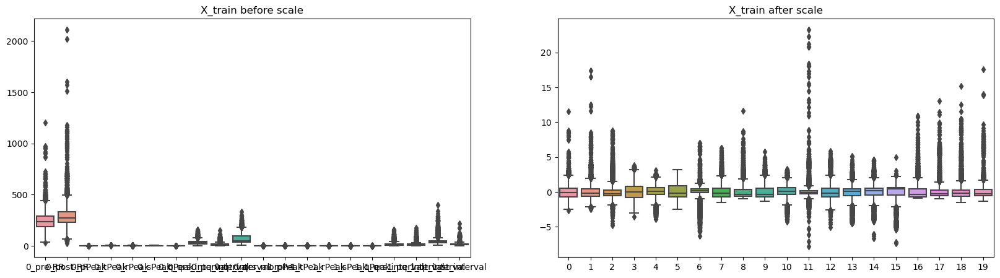

In [64]:
plt.subplots(figsize = (20,5))
plt.subplot(1,2,1)
# plt.ylim(0,100)

sns.boxplot(X_train)
plt.title("X_train before scale")
plt.subplot(1,2,2)
sns.boxplot(X_train_scaled)
plt.title("X_train after scale")

In [83]:
pickle.dump(clf,open('random_forest.pkl', 'wb'))

<IPython.core.display.Javascript object>

In [66]:
pickle.dump(sc,open('scaler.pkl', 'wb'))

<IPython.core.display.Javascript object>

<Axes: xlabel='type', ylabel='count'>

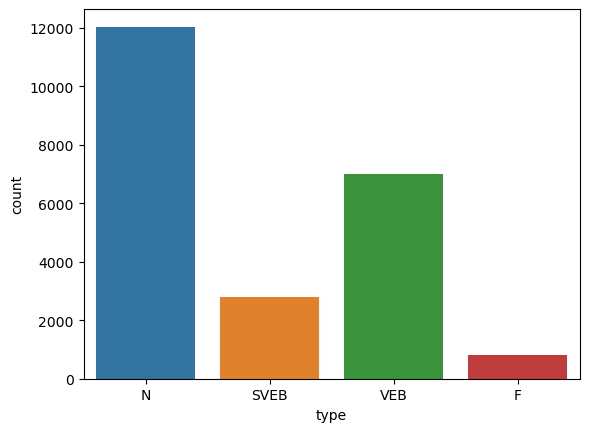

In [86]:
sns.countplot(data= df ,x = 'type')

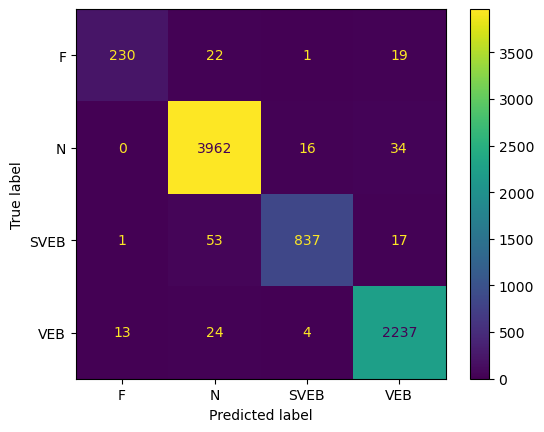

In [89]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred_clf, labels=clf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=clf.classes_)
disp.plot()

In [91]:
from sklearn.metrics import classification_report
target = ['N', 'SVEB', 'VEB', 'F']
print(classification_report(y_test, y_pred_clf,target_names=target))

              precision    recall  f1-score   support

           N       0.94      0.85      0.89       272
        SVEB       0.98      0.99      0.98      4012
         VEB       0.98      0.92      0.95       908
           F       0.97      0.98      0.98      2278

    accuracy                           0.97      7470
   macro avg       0.97      0.93      0.95      7470
weighted avg       0.97      0.97      0.97      7470



In [92]:
X_train.to_csv("train.csv")

In [93]:
X_train

,0_pre-RR,0_post-RR,0_pPeak,0_tPeak,0_rPeak,0_sPeak,0_qPeak,0_qrs_interval,0_pq_interval,0_qt_interval,0_qrs_morph4,1_pPeak,1_tPeak,1_rPeak,1_sPeak,1_qPeak,1_qrs_interval,1_pq_interval,1_qt_interval,1_st_interval
12480,314,315.0,0.273692,0.222385,0.498813,-0.439016,0.039564,22,7,94,-0.249133,0.058658,0.648782,-0.232307,-0.232307,-0.734710,9,23,54,22
7628,196,181.0,0.145012,1.046400,1.010024,1.010024,0.137631,21,4,27,0.783127,-0.022975,0.687439,-0.766045,-0.828008,-0.766045,4,30,68,34
22342,231,227.0,-0.120679,-0.346402,1.136273,-0.606119,-0.128208,24,3,34,-0.032267,-0.028709,0.467817,-0.047806,-0.047806,-0.061799,3,8,20,9
15992,168,226.0,0.038337,1.993751,-0.144811,-0.382532,-0.144811,5,6,28,-0.367459,0.128073,2.375595,0.298198,-3.026442,-0.125117,21,13,73,39
1593,271,285.0,-0.056656,0.427626,1.290167,-1.322640,-0.081139,39,6,149,-0.525098,0.099823,0.584668,-0.786000,-0.952911,-0.786000,3,13,54,38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11964,265,268.0,0.173866,0.274689,1.252547,-0.722633,-0.156590,61,19,156,0.014254,-0.014905,0.243006,-0.319380,-0.333194,-0.319380,1,17,43,25
21575,126,288.0,0.316800,1.252687,0.877828,-1.821234,0.310865,33,5,73,-0.539964,-0.264413,-0.268267,-0.268075,-0.268419,-0.268075,1,4,6,1
5390,125,205.0,-0.489159,0.794904,-1.683227,-1.918177,-1.683227,4,12,52,-1.896578,0.022096,0.139406,0.446181,-0.871477,-0.259812,32,18,77,27
860,190,446.0,0.375008,-0.692080,1.364307,-1.222920,-0.300822,58,46,116,1.220513,0.013763,0.576491,0.192840,-0.373610,-0.009184,25,7,43,11
